IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



/data/TransientData/MSCOCO/resized/val2014/COCO_val2014_000000051495.jpg
/data/TransientData/MSCOCO/resized/val2014/COCO_val2014_000000388066.jpg
/data/TransientData/MSCOCO/resized/val2014/COCO_val2014_000000260802.jpg
/data/TransientData/MSCOCO/resized/val2014/COCO_val2014_000000341921.jpg
/data/TransientData/MSCOCO/resized/val2014/COCO_val2014_000000086011.jpg
/data/TransientData/MSCOCO/resized/val2014/COCO_val2014_000000438999.jpg
/data/TransientData/MSCOCO/resized/val2014/COCO_val2014_000000006091.jpg
/data/TransientData/MSCOCO/resized/val2014/COCO_val2014_000000540564.jpg
/data/TransientData/MSCOCO/resized/val2014/COCO_val2014_000000031217.jpg
/data/TransientData/MSCOCO/resized/val2014/COCO_val2014_000000050576.jpg
/data/TransientData/MSCOCO/resized/val2014/COCO_val2014_000000085195.jpg
/data/TransientData/MSCOCO/resized/val2014/COCO_val2014_000000027585.jpg
/data/TransientData/MSCOCO/resized/val2014/COCO_val2014_000000285120.jpg
/data/TransientData/MSCOCO/resized/val2014/COCO_val

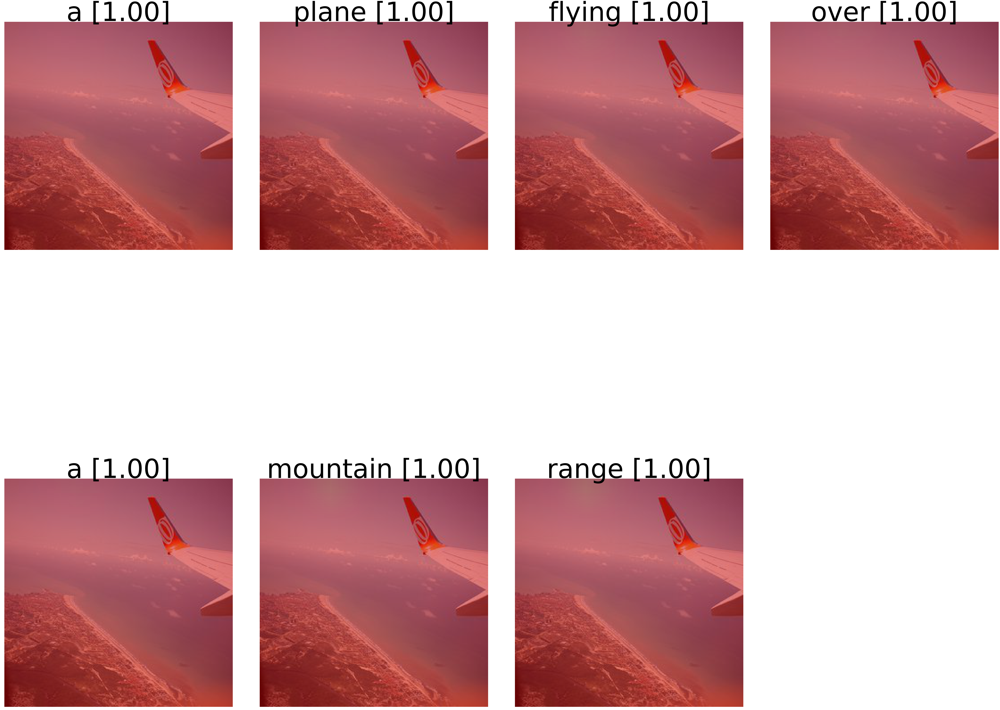


Attention Map of image: COCO_val2014_000000086011.jpg
Generated caption: a man sitting at a table with a laptop



Attention Map of image: COCO_val2014_000000027585.jpg
Generated caption: a clock tower with a clock on it in the middle of a town



Attention Map of image: COCO_val2014_000000253575.jpg
Generated caption: a polar bear is standing in the snow



Attention Map of image: COCO_val2014_000000356347.jpg
Generated caption: a bowl of soup with a fork and a spoon



Attention Map of image: COCO_val2014_000000251379.jpg
Generated caption: a parking meter with a parking meter on the side



Attention Map of image: COCO_val2014_000000075456.jpg
Generated caption: a pizza sitting on top of a white plate



Attention Map of image: COCO_val2014_000000166805.jpg
Generated caption: a piece of cake sitting on a plate with a fork



Attention Map of image: COCO_val2014_000000048684.jpg
Generated caption: a group of people sitting at a table with a cake


Process Process-9:
Process Process-12:
Process Process-10:
Process Process-11:
Traceback (most recent call last):
Traceback (most recent call last):
Traceback (most recent call last):
Traceback (most recent call last):
  File "/export/home/tess.berthier/anaconda3/envs/py27/lib/python2.7/multiprocessing/process.py", line 267, in _bootstrap
  File "/export/home/tess.berthier/anaconda3/envs/py27/lib/python2.7/multiprocessing/process.py", line 267, in _bootstrap
  File "/export/home/tess.berthier/anaconda3/envs/py27/lib/python2.7/multiprocessing/process.py", line 267, in _bootstrap
  File "/export/home/tess.berthier/anaconda3/envs/py27/lib/python2.7/multiprocessing/process.py", line 267, in _bootstrap
    self.run()
    self.run()
    self.run()
    self.run()
  File "/export/home/tess.berthier/anaconda3/envs/py27/lib/python2.7/multiprocessing/process.py", line 114, in run
  File "/export/home/tess.berthier/anaconda3/envs/py27/lib/python2.7/multiprocessing/process.py", line 114, in run
  F

KeyboardInterrupt: 

In [10]:
import torch
import matplotlib.pyplot as plt
import numpy as np
import cv2
import pickle
from utils2 import CocoImageFolder, to_var, show_images
from adaptive import Encoder2Decoder
from build_vocab import Vocabulary
from torch.autograd import Variable 
from torchvision import transforms

pretrained = 'models/adaptive-10.pkl'
images_path = '/data/TransientData/MSCOCO/resized/val2014/'
vocab_path = '/data/TransientData/MSCOCO/vocab.pkl'
caption_val_path = '/data/TransientData/MSCOCO/annotations/captions_val2014.json'
eval_size = 10
num_workers = 4

with open( vocab_path, 'rb') as f:
    vocab = pickle.load( f )

# Image transformation
transform = transforms.Compose([ 
    transforms.ToTensor(), 
    transforms.Normalize((0.485, 0.456, 0.406), 
                         (0.229, 0.224, 0.225))])

# Define model and load pretrained
model = Encoder2Decoder( 256, len( vocab ), 512 )
model.load_state_dict( torch.load( pretrained ) )
model.eval()

if torch.cuda.is_available():
    model.cuda()

# Evaluation image loader
cocoFolder = CocoImageFolder( images_path, caption_val_path, transform )
eval_data_loader = torch.utils.data.DataLoader( 
        cocoFolder, 
        batch_size = eval_size, 
        shuffle = False, num_workers = num_workers,
        drop_last = False )

for idx, (images, image_ids, filenames) in enumerate(eval_data_loader):
    images = to_var(images)
    generated_captions, attention, beta = model.sampler(images)
    
    captions = generated_captions.cpu().data.numpy()
    attention = attention.view(attention.size(0), attention.size(1), 8, 8).cpu().data.numpy()
    
    beta = beta.view(beta.size(0), beta.size(1)).cpu().data.numpy()
    
    for image_idx in range(captions.shape[0]):
        
        sampled_ids = captions[image_idx]
        sampled_caption = []
        
        for word_id in sampled_ids:
                
            word = vocab.idx2word[word_id]
            if word == '<end>':
                break
            else:
                sampled_caption.append(word)
        
        cap_len = len(sampled_caption)
        sentence = ' '.join(sampled_caption)
        image_attention = attention[image_idx, :cap_len, :, :]
        language_sentinel = beta[image_idx, :cap_len]
        
        # Create the Graph
        image_seq = []
        titles = []
        img = cv2.imread(images_path + filenames[image_idx])
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        
        for cap_idx, word in enumerate(sampled_caption):
            
            height, width, _ = img.shape
            
            heatmap = image_attention[ cap_idx ] * 8 # 7x7 attention map
            heatmap = np.uint8(heatmap * 255)
            heatmap = cv2.applyColorMap(cv2.resize(heatmap, (width, height)), cv2.COLORMAP_JET)
            
            result = np.uint8(heatmap * 0.4  + img * 0.5)
            image_seq.append(result)
            
            info = word + ' [%.2f]'%(language_sentinel[cap_idx])
            titles.append(info)
        
        # Plot the attention images each row with 4 columns
        print 'Attention Map of image:', filenames[image_idx]
        print 'Generated caption:', sentence
        show_images(image_seq, 4, titles)
        plt.show()
        print ''